### imports

In [23]:
import os
import pandas as pd
import folium
from folium.plugins import MarkerCluster
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from zlib import crc32
import random
import seaborn as sns

from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR


### 1. Fetch data

In [2]:
"""
Fetch .csv data from directories.
"""

csv_path = os.path.join('data')
all_files = os.listdir(csv_path)
csv_files = [f for f in all_files if f.count('rent') == 1 and f.count('.csv') == 1] # if you want rent-apartments, set 1 instad 0
df_list = []

for csv in csv_files:
    file_path = os.path.join(csv_path, csv)
    try:
        # Try reading the file using default UTF-8 encoding
        df = pd.read_csv(file_path)
        df_list.append(df)
    except Exception as e:
        print(f"Could not read file {csv}, error: {e}")

data = pd.concat(df_list, ignore_index=True)

print(f"Samples amount: {len(data)}")
data.head()

Samples amount: 43305


,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,pharmacyDistance,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price
0,2a1a6db97ff122d6bc148abb6f0e498a,szczecin,blockOfFlats,52.0,2.0,3.0,3.0,2008.0,53.460535,14.545416,...,0.307,condominium,brick,NaN,yes,yes,no,no,no,3500
1,5a0cb42c088eadf75aa98a4118640048,szczecin,blockOfFlats,57.0,3.0,NaN,10.0,1976.0,53.440955,14.566024,...,0.189,condominium,NaN,premium,no,yes,yes,no,no,3000
2,996722490efcb4b34d48bb84a9a72838,szczecin,NaN,43.4,2.0,3.0,4.0,NaN,53.435746,14.560764,...,0.211,condominium,NaN,NaN,no,yes,no,no,no,1900
3,50d75c688530b9a61ba505301e0b94a9,szczecin,apartmentBuilding,32.6,2.0,5.0,6.0,2021.0,53.421582,14.541572,...,0.192,condominium,brick,premium,no,yes,yes,no,no,2500
4,9b187f4203adabf466fd08610d8f4e5e,szczecin,apartmentBuilding,72.0,3.0,6.0,6.0,2014.0,53.450010,14.547230,...,0.315,condominium,brick,premium,no,yes,yes,no,yes,2999


### 2. Data cleaning

In [3]:
"""
Check data type.
"""

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43305 entries, 0 to 43304
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    43305 non-null  object 
 1   city                  43305 non-null  object 
 2   type                  32595 non-null  object 
 3   squareMeters          43305 non-null  float64
 4   rooms                 43305 non-null  float64
 5   floor                 37970 non-null  float64
 6   floorCount            42399 non-null  float64
 7   buildYear             30814 non-null  float64
 8   latitude              43305 non-null  float64
 9   longitude             43305 non-null  float64
 10  centreDistance        43305 non-null  float64
 11  poiCount              43305 non-null  float64
 12  schoolDistance        43294 non-null  float64
 13  clinicDistance        43274 non-null  float64
 14  postOfficeDistance    43286 non-null  float64
 15  kindergartenDistanc

In [4]:
"""
Clean NaN and duplicates. Drop columns with lack of data.
"""

dropped_columns = ['id','type', 'floor', 'buildYear', 'condition', 'buildingMaterial']
data.drop(dropped_columns, axis=1, inplace=True)
data.dropna(inplace=True)
data = data.drop_duplicates().reset_index(drop=True)

In [5]:
"""
Check number of null values.
"""

print(f"Dataset amount: {len(data)}")
data.isna().sum()

Dataset amount: 23290


city                    0
squareMeters            0
rooms                   0
floorCount              0
latitude                0
longitude               0
centreDistance          0
poiCount                0
schoolDistance          0
clinicDistance          0
postOfficeDistance      0
kindergartenDistance    0
restaurantDistance      0
collegeDistance         0
pharmacyDistance        0
ownership               0
hasParkingSpace         0
hasBalcony              0
hasElevator             0
hasSecurity             0
hasStorageRoom          0
price                   0
dtype: int64

### 3. Analize cleared data

In [6]:
"""
Statistics.
"""

data.describe()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,price
count,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000,23290.000000
mean,54.108121,2.355217,5.807986,51.775312,19.636897,3.854090,24.139244,0.362612,0.761371,0.460855,0.315003,0.252086,1.320834,0.299335,3741.364448
std,21.321799,0.838352,3.522447,1.221669,1.671151,2.524074,25.679261,0.303889,0.688861,0.341836,0.276337,0.273687,1.025702,0.281773,2209.128507
min,25.000000,1.000000,1.000000,49.984500,14.468420,0.020000,0.000000,0.002000,0.001000,0.001000,0.001000,0.001000,0.004000,0.001000,780.000000
25%,40.000000,2.000000,4.000000,51.060806,18.606012,1.820000,9.000000,0.176000,0.302000,0.238000,0.151000,0.089000,0.545000,0.136000,2500.000000
50%,49.220000,2.000000,5.000000,52.183068,19.952032,3.440000,16.000000,0.287000,0.560000,0.391000,0.258000,0.184000,1.010000,0.233000,3000.000000
75%,62.007500,3.000000,7.000000,52.252178,20.997603,5.410000,29.000000,0.451750,0.964000,0.581000,0.397000,0.327000,1.857000,0.381000,4246.000000
max,150.000000,6.000000,29.000000,54.571300,23.199087,16.400000,210.000000,4.109000,4.912000,4.128000,4.231000,4.210000,5.000000,4.198000,23000.000000


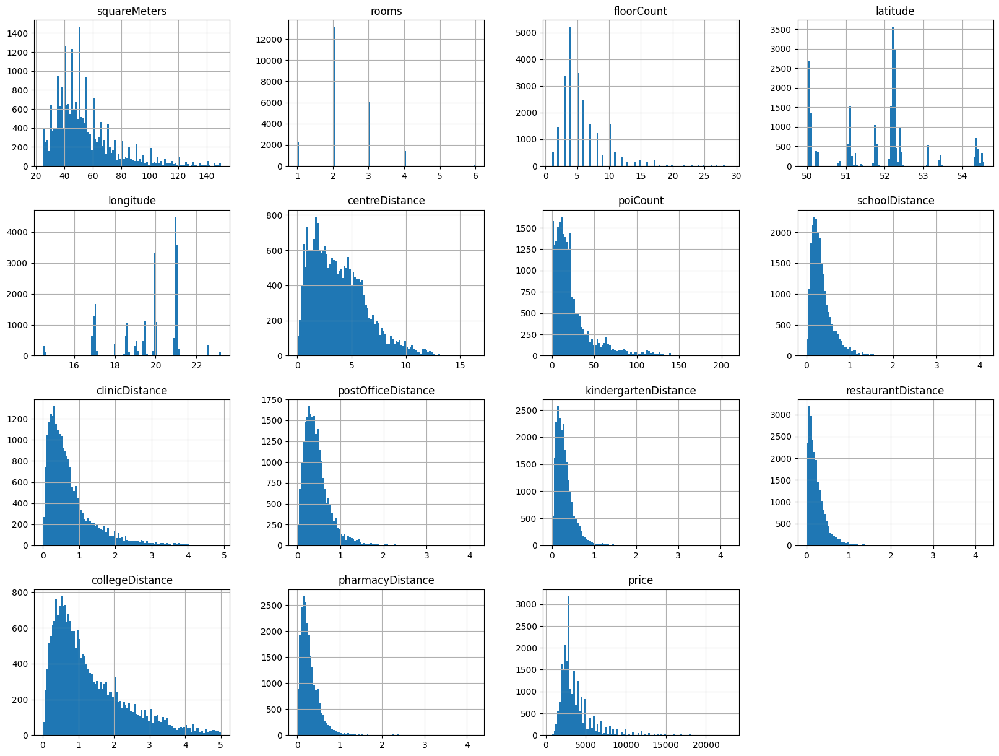

In [7]:
"""
Histograms.
"""

%matplotlib inline
data.hist(bins=100, figsize=(20,15))
plt.show()

In [8]:
"""
Locations on map.
This kind of map is loading quite long, but I think its worth it.
"""

locations = list(zip(data['latitude'], data['longitude']))
m = folium.Map(
    location=[np.mean(data['latitude']), np.mean(data['longitude'])],
    zoom_start=6
)
 
marker_cluster = MarkerCluster(locations=locations)
marker_cluster.add_to(m)
m

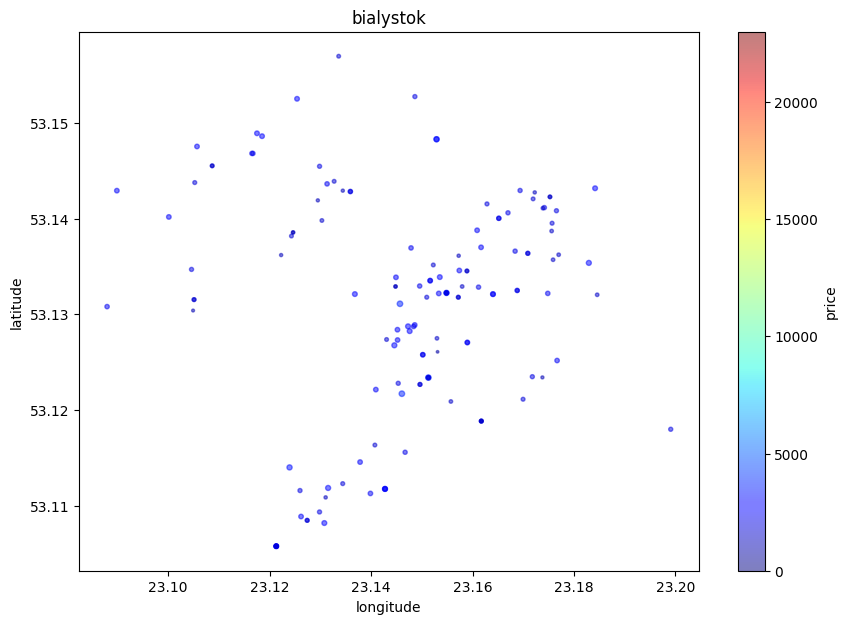

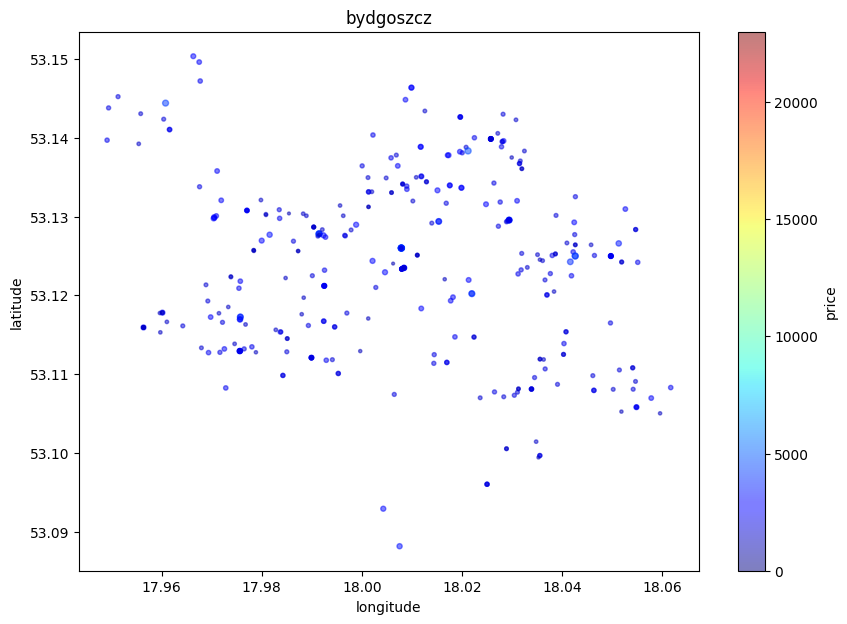

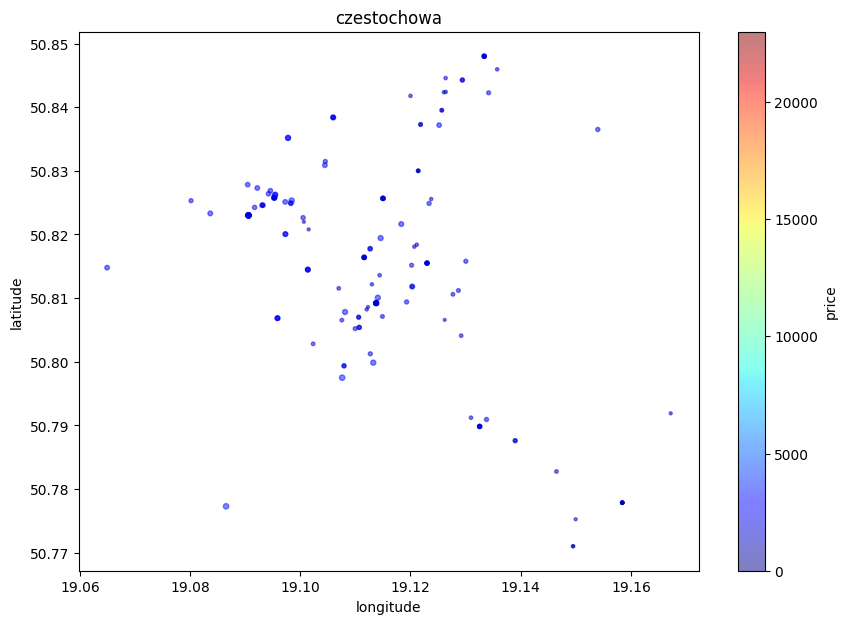

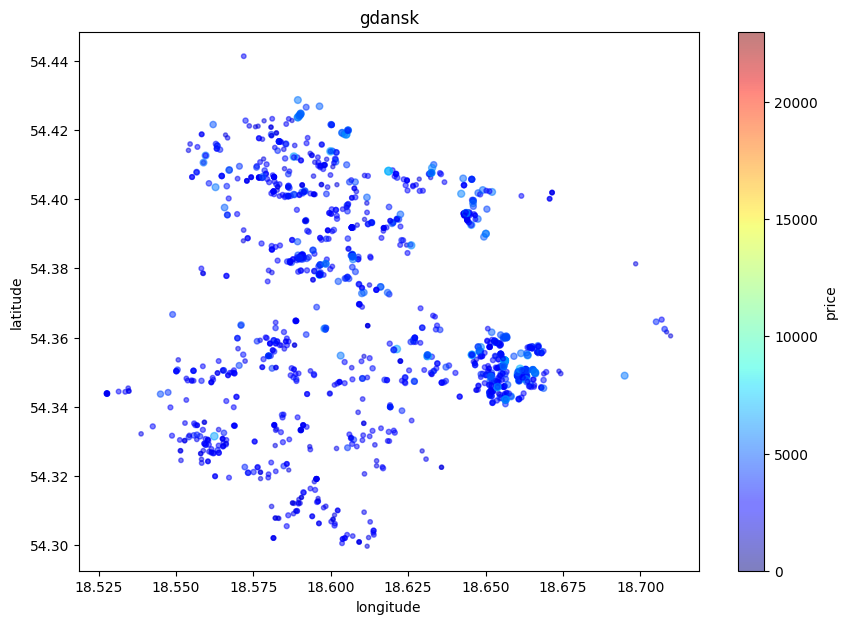

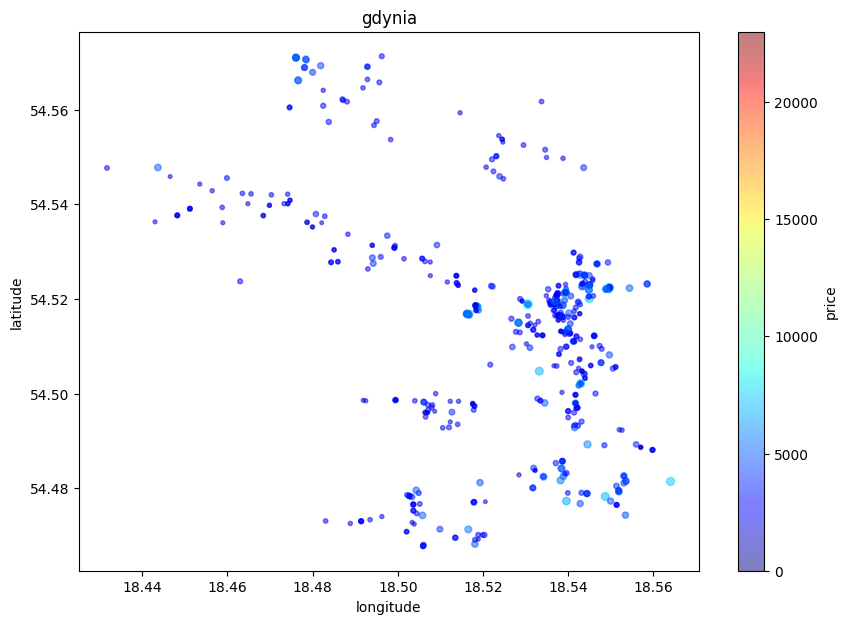

...

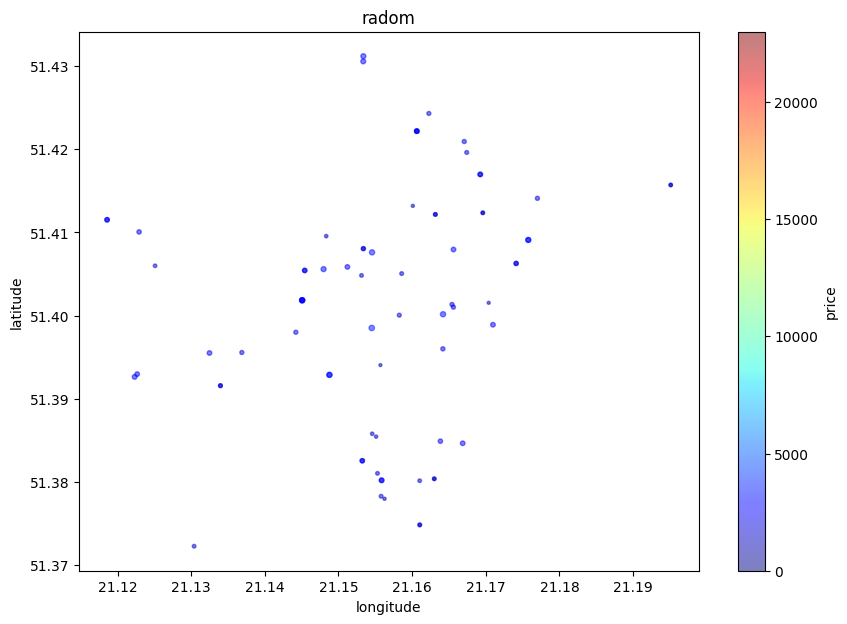

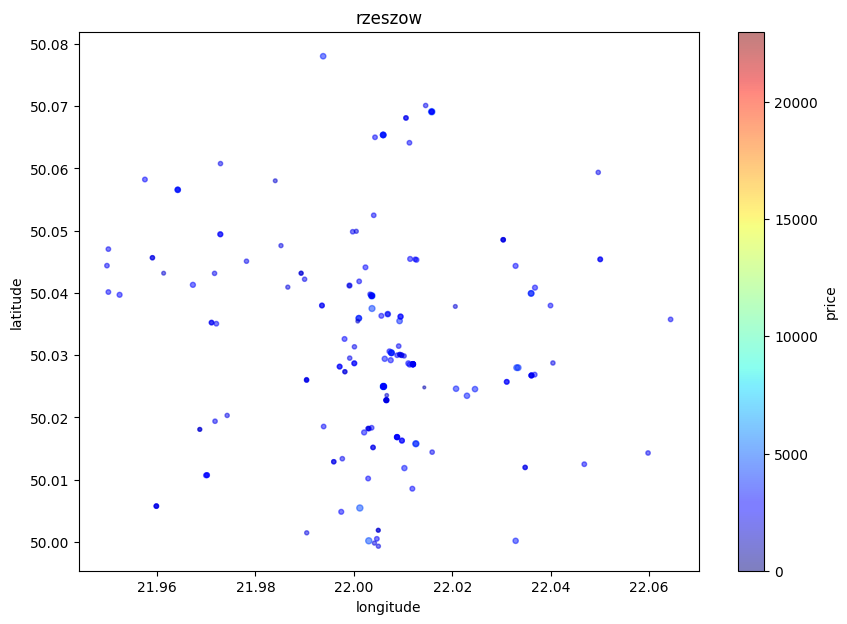

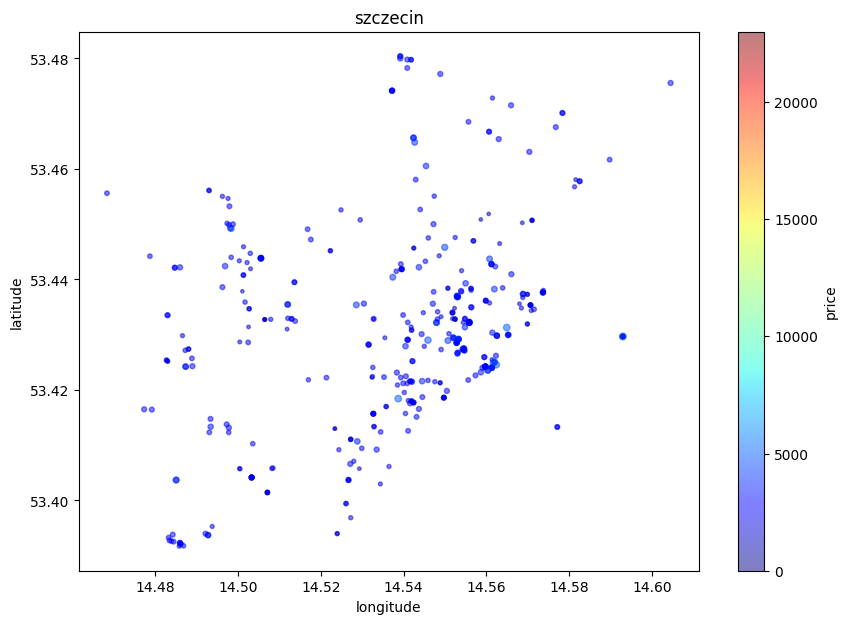

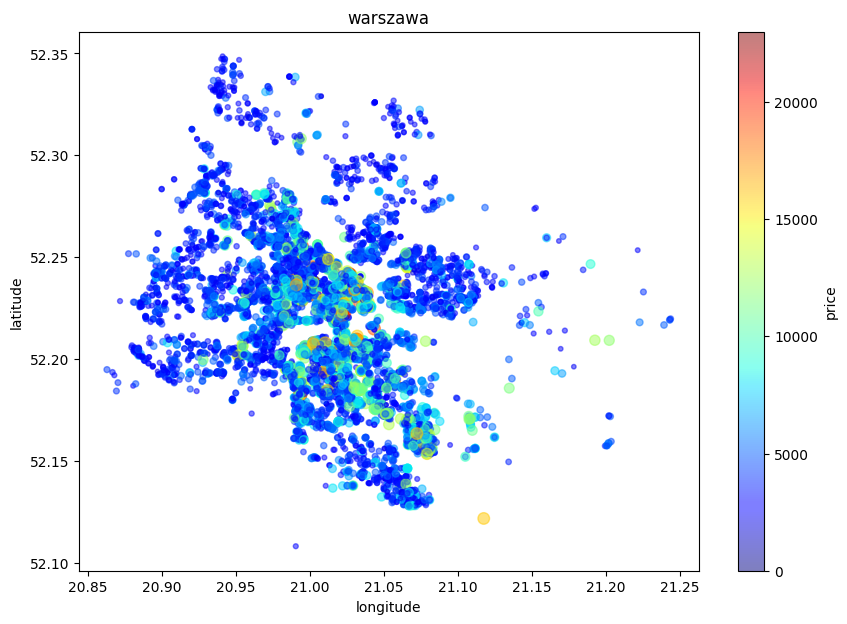

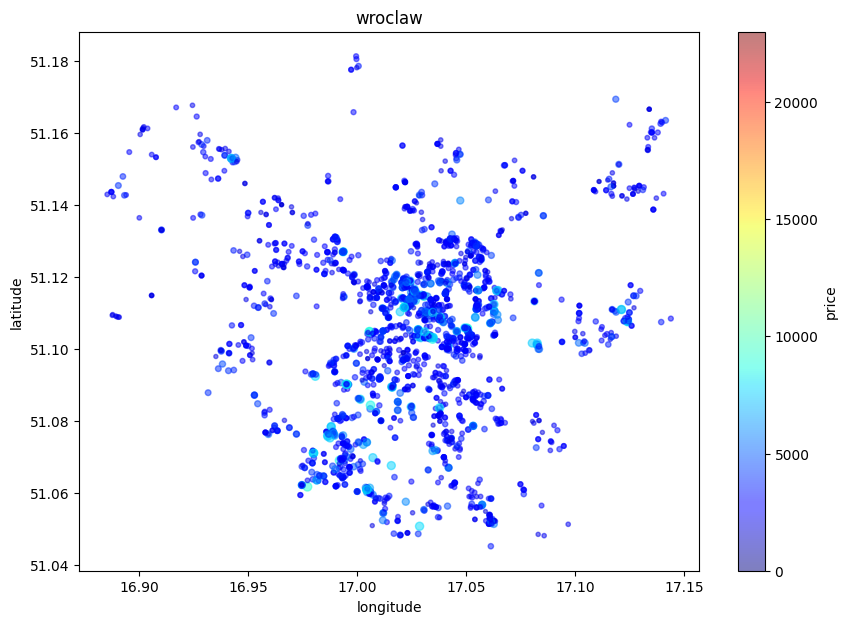

In [9]:
"""
Locations based on price.
"""

cities = np.unique(data['city'])
max_price = max(data['price'])
norm = Normalize(vmin=0, vmax=max_price)

for city in cities:
    subset = data[data['city'] == city]
    subset.plot(
        kind='scatter',
        x='longitude',
        y='latitude',
        title=city,
        alpha=0.5,
        s=100 * subset['price'] / max_price,
        figsize=(10, 7),
        c='price',
        norm=norm,
        cmap=plt.get_cmap('jet'),
        colorbar=True
    )

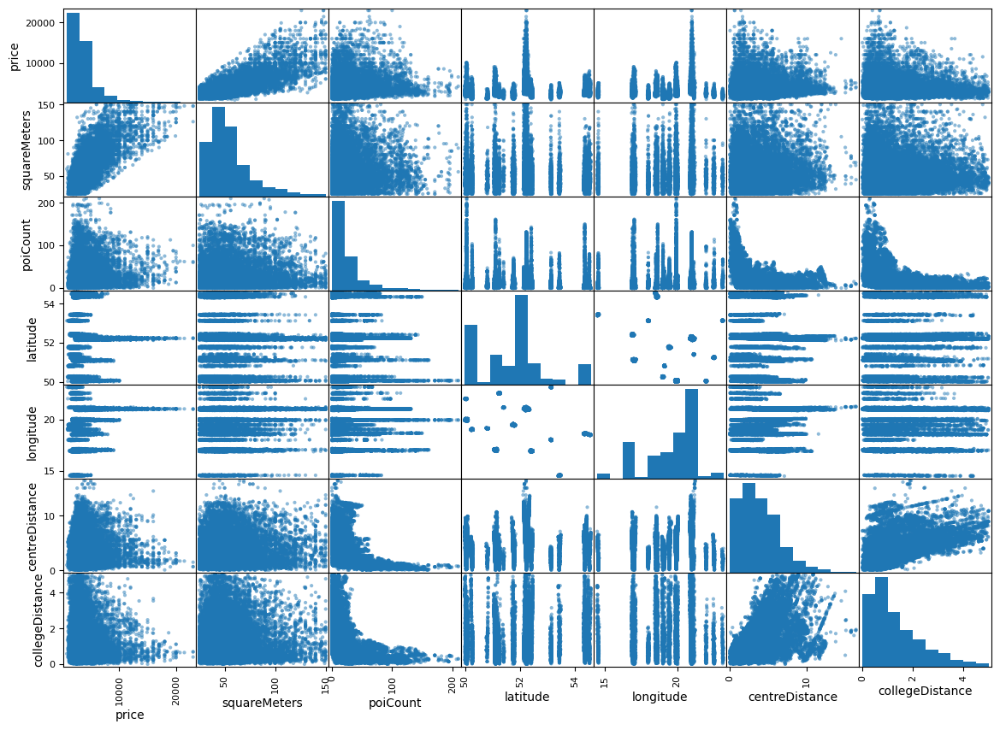

In [10]:
"""
Corelation matrix.
"""

%matplotlib inline
from pandas.plotting import scatter_matrix

attributes = ['price', 'squareMeters', 'poiCount', 'latitude', 'longitude', 'centreDistance', 'collegeDistance']
scatter_matrix(data[attributes], figsize=(14,10))
plt.show()

<AxesSubplot:>

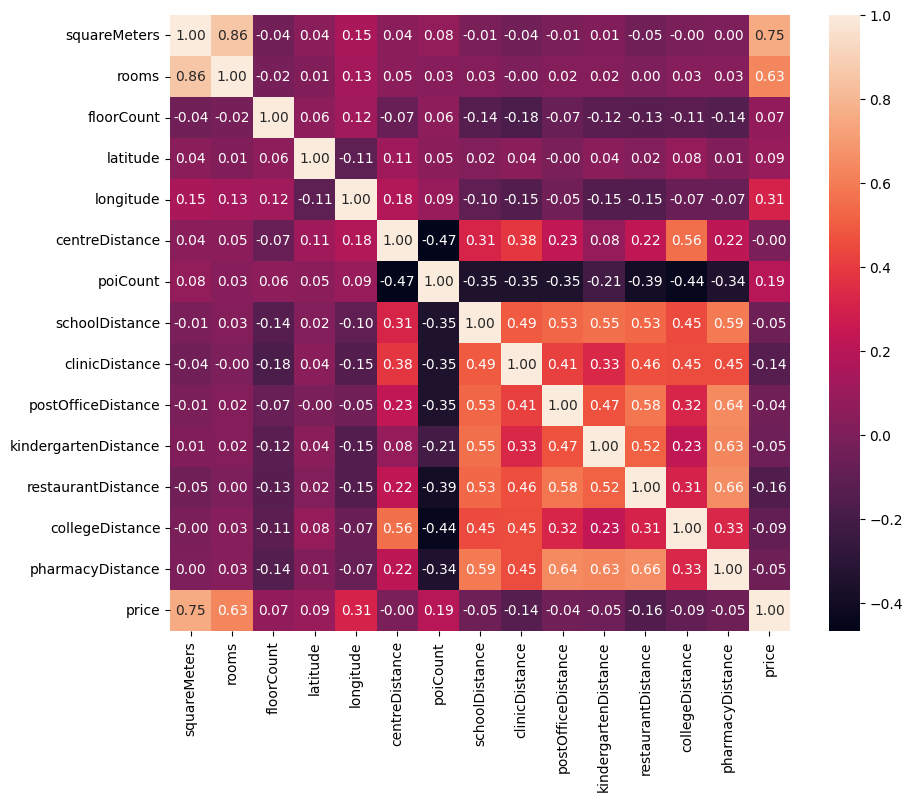

In [11]:
"""
Heatmap.
"""

plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(numeric_only=True), annot=True, fmt = '.2f')

### 4. Split and build data

In [12]:
"""
One-hot coding for cities.
"""

city_dummies = pd.get_dummies(data['city'])
data = data.drop('city', axis=1)
data = pd.concat([data, city_dummies], axis=1)

In [13]:
"""
Normalization and exclude numerical columns.
"""

scaler = MinMaxScaler()
numerical_columns = data.select_dtypes(include=['number']).columns
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])
data = data[numerical_columns]

In [14]:
"""
Split data to train and test.
"""

test_ratio = 0.1 # 10% of amount is test data
y = data['price']
X = data.drop(columns=['price'])
rand_val = random.randint(0, 111)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_ratio, random_state=rand_val)

print(f"Training set amount: {len(X_train)}\nTest set amount: {len(X_test)}")



Training set amount: 20961
Test set amount: 2329


In [15]:
"""
Check columns and data example.
"""

X_train.head()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,...,katowice,krakow,lodz,lublin,poznan,radom,rzeszow,szczecin,warszawa,wroclaw
9789,0.136,0.2,0.178571,0.487924,0.741283,0.269231,0.161905,0.093499,0.020973,0.027138,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9754,0.176,0.4,0.071429,0.481390,0.750104,0.271062,0.123810,0.078403,0.052739,0.064696,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
11274,0.192,0.2,0.071429,0.020192,0.630086,0.199634,0.052381,0.036523,0.103849,0.095953,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21114,0.160,0.2,0.214286,0.469870,0.754843,0.664225,0.123810,0.061115,0.043372,0.041677,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9755,0.236,0.2,0.285714,0.479652,0.753147,0.360195,0.023810,0.088629,0.018326,0.116307,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### 5. Build models


R^2 factor: 0.692


<AxesSubplot:xlabel='Actual', ylabel='Predicted'>

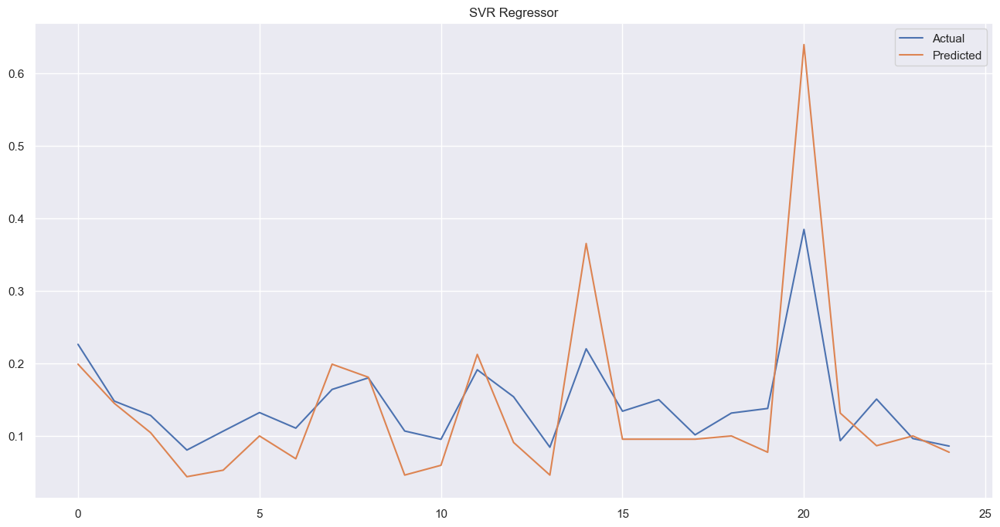

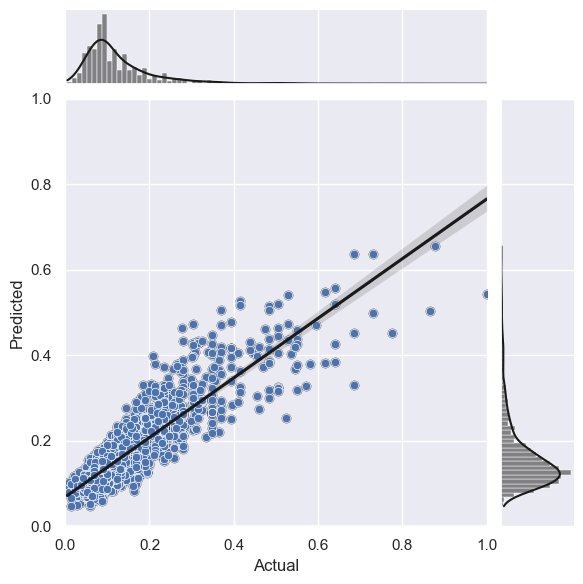

In [42]:
"""
Support vector machine regressor for every attribute (reg_svr_14f)
""" 

parameters={
    'kernel': 'rbf',
    'C': 1.0,
    'epsilon': 0.1,
    'gamma': 'scale'
}

reg_svr_14f = SVR(**parameters)
reg_svr_14f.fit(X_train, y_train)
y_pred = reg_svr_14f.predict(X_test)
print("\nR^2 factor: " + "{:.3f}".format(r2_score(y_test, y_pred)))

y_diff = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig = plt.figure(figsize=(16,8))
y_diff = y_diff.reset_index()
y_diff = y_diff.drop(['index'],axis=1)
plt.plot(y_diff[:25])
plt.title("SVR Regressor")
plt.legend(['Actual','Predicted'])
sns.set(style='darkgrid')
jplot = sns.jointplot(
    xlim=(0,1.0),
    ylim=(0, 1.0),
    x='Actual',
    y='Predicted',
    data=y_diff,
    kind='reg',
    color='k'
);
sns.scatterplot(
    data=y_diff,
    x='Actual',
    y='Predicted',
    ax=jplot.ax_joint,
)


R^2 factor: 0.811


<AxesSubplot:xlabel='Actual', ylabel='Predicted'>

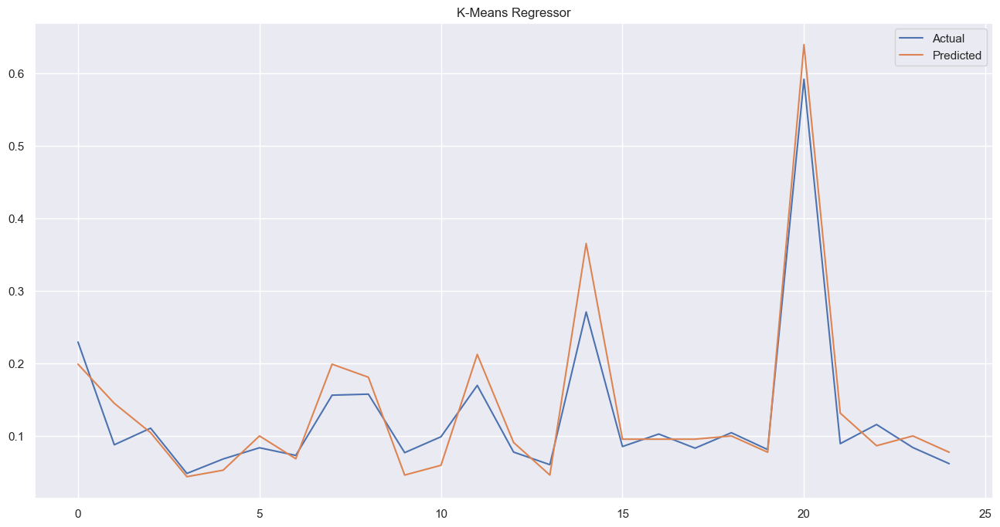

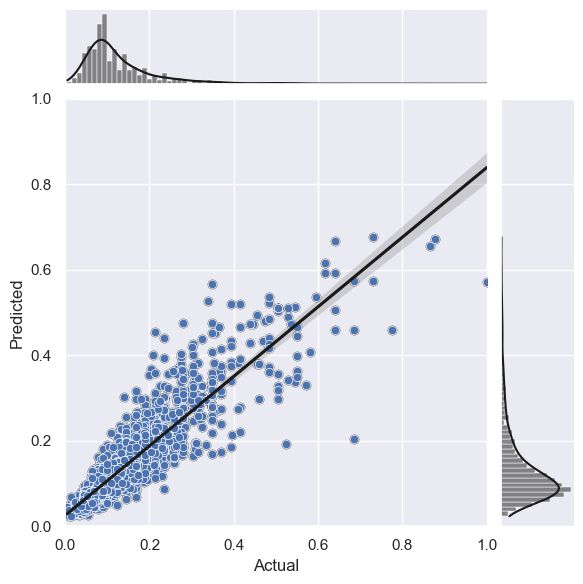

In [43]:
"""
K-Mean regressor for every attribute (reg_km_14f)
""" 

parameters={
    'n_clusters': 8,
    'init': 'k-means++',
    'n_init': 10,
    'max_iter': 300
}

reg_km_14f = KNeighborsRegressor(**parameters)
reg_km_14f.fit(X_train, y_train)
y_pred = reg_km_14f.predict(X_test)
print("\nR^2 factor: " + "{:.3f}".format(r2_score(y_test, y_pred)))

y_diff = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig = plt.figure(figsize=(16,8))
y_diff = y_diff.reset_index()
y_diff = y_diff.drop(['index'],axis=1)
plt.plot(y_diff[:25])
plt.title("K-Means Regressor")
plt.legend(['Actual','Predicted'])
sns.set(style='darkgrid')
jplot = sns.jointplot(
    xlim=(0,1.0),
    ylim=(0, 1.0),
    x='Actual',
    y='Predicted',
    data=y_diff,
    kind='reg',
    color='k'
);
sns.scatterplot(
    data=y_diff,
    x='Actual',
    y='Predicted',
    ax=jplot.ax_joint,
)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 50, 'min_samples_split': 3, 'max_features': 0.75, 'max_depth': 15, 'criterion': 'friedman_mse'}
Lowest MSE: -0.00

R^2 factor: 0.861


<AxesSubplot:xlabel='Actual', ylabel='Predicted'>

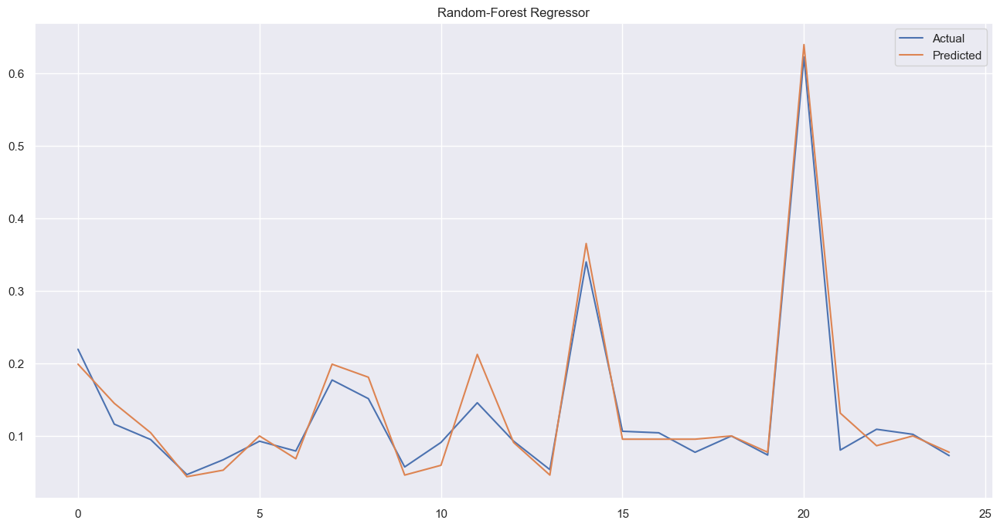

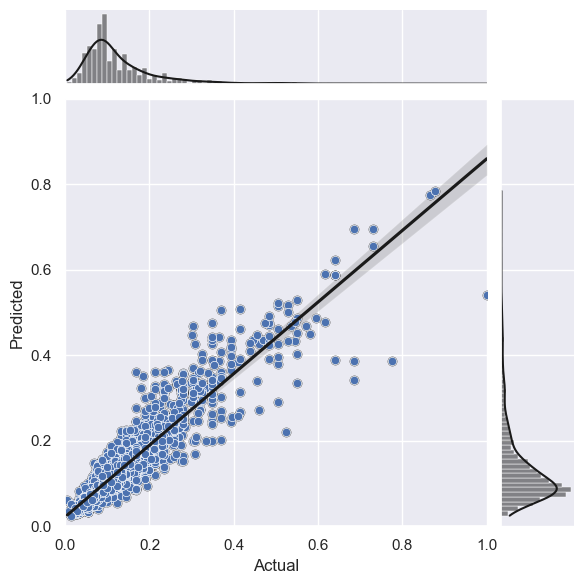

In [51]:
"""
Random forest regressor for every attribute (reg_rf_14f)

Default:
parameters={
    'n_estimators': 100,
    'criterion': 'mse',
    'max_depth': None,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'max_features': 'auto',
    'bootstrap': True
}
""" 

parameters={
    'max_depth': [None, 5, 10, 15],
    'n_estimators': [10, 25, 50, 100],
    'criterion':['squared_error', 'poisson', 'friedman_mse'],
    'min_samples_split': [2, 4, 8],
    'min_samples_split': [2, 3],
    'max_features': [0.5, 0.75, 1.0]
}

rf_reg = RandomForestRegressor()
reg = RandomizedSearchCV(
    estimator=rf_reg,
    param_distributions=parameters,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)
reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))
print("Lowest MSE: "+ "{:.2f}".format(reg.best_score_))

reg_rf_14f = RandomForestRegressor(**reg.best_params_)
reg_rf_14f.fit(X_train, y_train)
y_pred = reg_rf_14f.predict(X_test)
print("\nR^2 factor: " + "{:.3f}".format(r2_score(y_test, y_pred)))

y_diff = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig = plt.figure(figsize=(16,8))
y_diff = y_diff.reset_index()
y_diff = y_diff.drop(['index'],axis=1)
plt.plot(y_diff[:25])
plt.title("Random-Forest Regressor")
plt.legend(['Actual','Predicted'])
sns.set(style='darkgrid')
jplot = sns.jointplot(
    xlim=(0,1.0),
    ylim=(0, 1.0),
    x='Actual',
    y='Predicted',
    data=y_diff,
    kind='reg',
    color='k'
);
sns.scatterplot(
    data=y_diff,
    x='Actual',
    y='Predicted',
    ax=jplot.ax_joint,
)


R^2 factor: 0.803


<AxesSubplot:xlabel='Actual', ylabel='Predicted'>

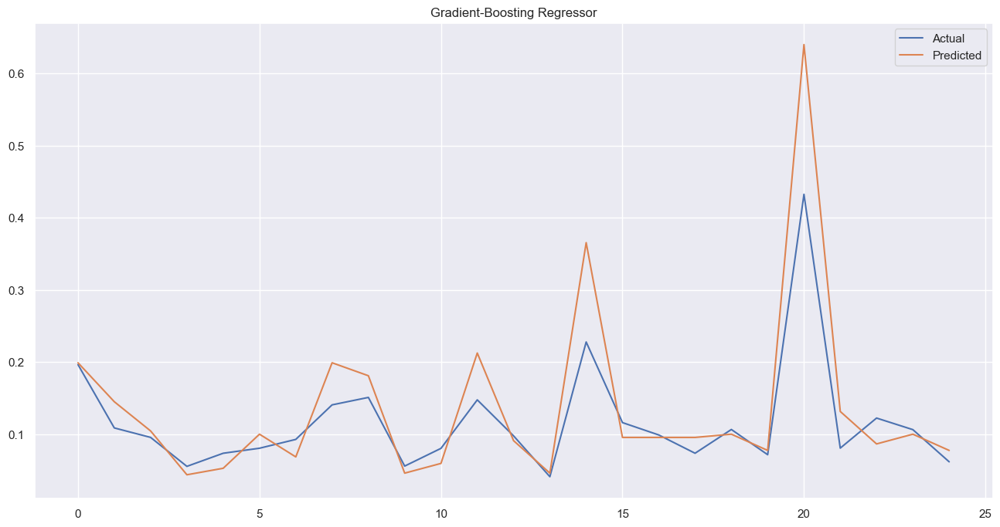

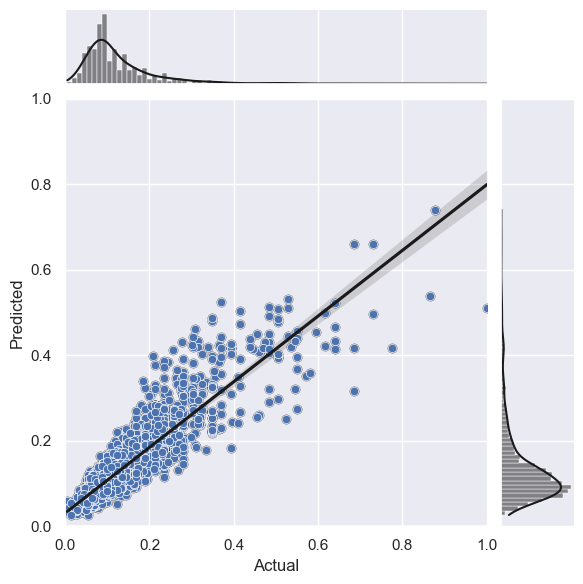

In [54]:
"""
Gradient boosting regressor for every attribute (reg_gb_14f)
""" 

parameters={
    'loss': 'squared_error',
    'learning_rate': 0.1,
    'n_estimators': 100,
    'subsample': 1.0,
    'criterion': 'friedman_mse',
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'max_depth': 3,
    'max_features': None,
    'alpha': 0.9
}

reg_gb_14f = GradientBoostingRegressor(**parameters)
reg_gb_14f.fit(X_train, y_train)
y_pred = reg_gb_14f.predict(X_test)
print("\nR^2 factor: " + "{:.3f}".format(r2_score(y_test, y_pred)))

y_diff = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig = plt.figure(figsize=(16,8))
y_diff = y_diff.reset_index()
y_diff = y_diff.drop(['index'],axis=1)
plt.plot(y_diff[:25])
plt.legend(['Actual','Predicted'])
plt.title("Gradient-Boosting Regressor")
sns.set(style='darkgrid')
jplot = sns.jointplot(
    xlim=(0,1.0),
    ylim=(0, 1.0),
    x='Actual',
    y='Predicted',
    data=y_diff,
    kind='reg',
    color='k'
);
sns.scatterplot(
    data=y_diff,
    x='Actual',
    y='Predicted',
    ax=jplot.ax_joint,
)


R^2 factor: 0.857


<AxesSubplot:xlabel='Actual', ylabel='Predicted'>

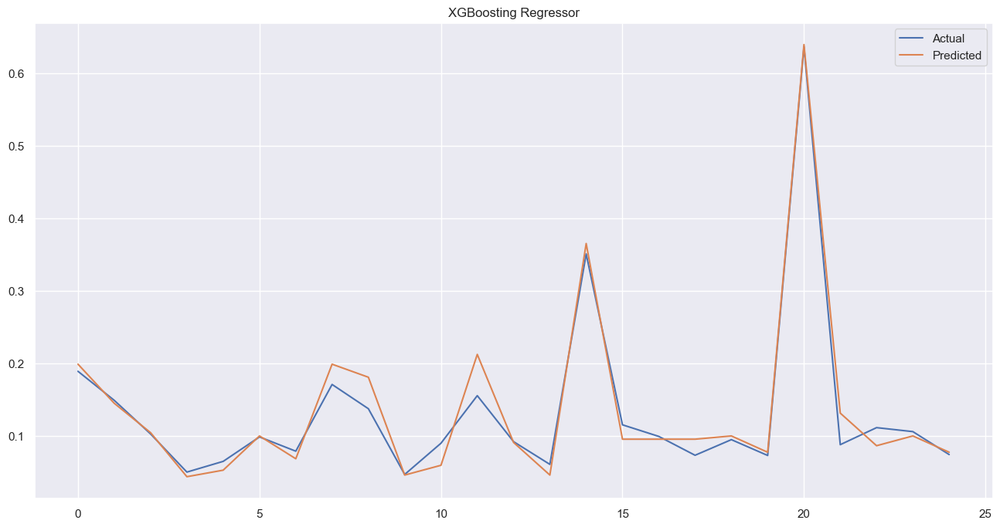

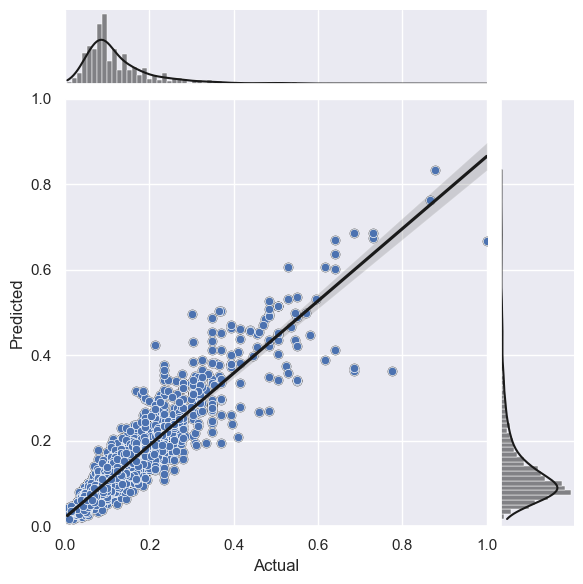

In [65]:
"""
XGBoosting regressor for every attribute (reg_xgb_14f)
""" 

parameters={
    'booster': 'gbtree',
    'learning_rate': 0.1,
    'n_estimators': 100,
    'max_depth': 3,
    'min_child_weight': 1,
    'subsample': 1,
    'colsample_bytree': 1,
    'gamma': 0,
    'reg_alpha': 0,
    'reg_lambda': 1,
    'objective': 'binary:logistic',
    'n_jobs': 1,
    'nthread': None,
    'max_delta_step': 0,
    'colsample_bytree': 1,
    'colsample_bylevel': 1,
    'scale_pos_weight': 1,
    'base_score': 0.5,
    'random_state': 0,
    'seed': None
}

reg_xgb_14f = xgb.XGBRegressor()
reg_xgb_14f.fit(X_train, y_train)
y_pred = reg_xgb_14f.predict(X_test)
print("\nR^2 factor: " + "{:.3f}".format(r2_score(y_test, y_pred)))

y_diff = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig = plt.figure(figsize=(16,8))
y_diff = y_diff.reset_index()
y_diff = y_diff.drop(['index'],axis=1)
plt.plot(y_diff[:25])
plt.title("XGBoosting Regressor")
plt.legend(['Actual','Predicted'])
sns.set(style='darkgrid')
jplot = sns.jointplot(
    xlim=(0,1.0),
    ylim=(0, 1.0),
    x='Actual',
    y='Predicted',
    data=y_diff,
    kind='reg',
    color='k'
);
sns.scatterplot(
    data=y_diff,
    x='Actual',
    y='Predicted',
    ax=jplot.ax_joint,
)

### 6. Export model to PMML

In [ ]:
from sklearn2pmml import PMMLPipeline
from sklearn2pmml import sklearn2pmml

pipeline = PMMLPipeline([("estimator", reg_14f)])
sklearn2pmml(pipeline, "reg_14f.pmml", with_repr=True)